<a href="https://colab.research.google.com/github/drSever/drSever_data_science/blob/main/Learning_projects_dl/project_4/project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Задача
Распознавание лиц — ключевая область в области компьютерного зрения и распознавания образов. Значительный объём исследований в прошлом способствовал созданию сложных алгоритмов распознавания лиц. С развитием свёрточных сетей стала возможна высокоточная классификация изображений. В прошлом модуле вы успешно распознали пятерых селебритис IT индустрии, обучив классификатор.     
Помимо разметки изображений часто встречаются задачи, когда важен определенный объект на изображении. Например, в связи с недавней вспышкой COVID19, ношение медицинских масок стало обязательным для всех, кто находится вне своего дома, что, в свою очередь привело к необходимости создания подхода для детектирования масок на лицах людей.

Представьте, что вашей компании выпала возможность помочь миру путем обучения модели для контроля ношения масок людьми. При этом вы хотите сравнить два типа изученных детекторов (одноуровневые и двухуровневые) и предоставить небольшой отчет своему руководству. Для того, чтобы обосновать коллегам выбор модели, вы решили использовать метрики Intersection over Union и Average Precision.

Данные для обучения находятся на платформе [Kaggle](https://www.kaggle.com/andrewmvd/face-mask-detection).

Набор данных состоит из 853 изображений.

Пример изображений:

<image src="https://lms-cdn.skillfactory.ru/assets/courseware/v1/57a64fafc1db095ca24dcf9f1d415b16/asset-v1:SkillFactory+DSPR-CV+ALWAYS+type@asset+block/DSPRCV_Proj2_1_2.png.png" alt="Пример изображения" width="400">


Пример того, что хотим получить:

<image src="https://lms-cdn.skillfactory.ru/assets/courseware/v1/d224e27328c8342814ede7ad94f890b3/asset-v1:SkillFactory+DSPR-CV+ALWAYS+type@asset+block/DSPRCV_Proj2_1_3.png.png" alt="Пример изображения" width="400">

# Решение

Для детектирования объектов на изображении используются 2 типа детекторов: одноступенчатые и двухступенчатые. Возьмем по одному детектору каждого типа, обучим на наших данных, получим метрики и сравним их. Из одноступенчатых будем использовать YOLO, из двухступенчатых - Faster RCNN.

При обучении модели Faster RCNN обнаружены ошибки, связанные c преобразованиями некоторых изображений (значения *x_max* выходят за диапазон [0,1] или *x_max < x_min*). При просмотре аннотаций ошибок не найдено. Поиск в интеренете приводит к выводу, что проблема связана с багами библиотеки Albumentations. Использованы разные методы обхода данного бага (например, если *x_max > 1*, то *x_max=1* и т.д.), но оптимальным решением принято удаление тех изображений из датасета, которые приводят к багам.

Надо также отметить, что наличие данных изображений в датасете не приводит к проблемам в работе YOLO.

## 1. Установим необходимые библиотеки и импортируем неоходимые модули:

In [1]:
!pip install -q kaggle
!pip install -q colorama

In [2]:
from google.colab import files

import numpy as np
import pandas as pd

import os
import glob
import xml.etree.ElementTree as et
from tqdm.notebook import tqdm, trange
import random
import colorama

import cv2
from PIL import Image, ImageDraw

import torch
import torchvision
from torchvision import transforms, datasets, models
from sklearn.metrics import auc
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
import albumentations as A
from albumentations.pytorch.transforms import ToTensorV2

import matplotlib.pyplot as plt
import matplotlib.patches as patches

# настройка визуализации
%matplotlib inline
plt.style.use('seaborn-v0_8')
%config InlineBackend.figure_format = "retina"

## 2. Загрузка данных с платформы Kaggle

Для загрузки данных с платформы Kaggle необходимо зайти в свой аккаунт на данной платформе и поучить Api Token (Your profile / Account / Create New Token) и сохранить его у себя на компьютере в виде файла .json

Теперь необходимо загрузить полученный токен (нажмите в ячейке вывода `"выбор файлов"`). Затем создадим новую скрытую папку `kaggle` (в домашней папке пользователя), скопируем туда полученный файл, установим разрешения на чтение/запись только для автора ноутбука:

In [3]:
# загружаем полученный токен
files.upload()

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"aleksandrdssf","key":"3e21d97c09d9f6bf346c3135102d7555"}'}

In [4]:
# создаем новую папку kaggle
!mkdir -p ~/.kaggle

# копируем в нее токен
!cp kaggle.json ~/.kaggle/

# устанавливаем права доступа на файл токена
!chmod 600 /root/.kaggle/kaggle.json

В разделе датасета, который хотим скачать, нажимаем `copy API command`, вставляем в кодовую ячейку ноутбука, не забыв поставить "!" перед коммандой:

In [5]:
!kaggle datasets download -d andrewmvd/face-mask-detection

100% 396M/398M [00:12<00:00, 36.6MB/s]
100% 398M/398M [00:12<00:00, 33.3MB/s]


Создадим папку data, куда разархивируем полученный данные:

In [6]:
!mkdir data
!unzip -q face-mask-detection.zip -d data

## 3. Faster RCNN

### 3.1. Подготовка данных

Задаим путь к файлам изображений и аннотаций:

In [7]:
images_dir = './data/images/'
annotations_dir = './data/annotations/'

Зададим размер батча и число num_workers:

In [8]:
batch_size = 10
num_workers = 8

Удалим изображения, которые ведут к багам библиотеки Albumentations:

In [9]:
files_for_del = [
    'maksssksksss457',
    'maksssksksss706',
    'maksssksksss251',
    'maksssksksss501',
    'maksssksksss110',
    'maksssksksss616',
    'maksssksksss231',
    'maksssksksss93',
    'maksssksksss5',
    'maksssksksss787',
    'maksssksksss603'
]

for file in files_for_del:
    os.remove(f'{images_dir}/{file}.png')
    os.remove(f'{annotations_dir}/{file}.xml')

Загрузка данных в DataLoader:

In [10]:
class FaceMaskDataset(torch.utils.data.Dataset):

    def __init__(self, images_dir, annotation_dir,width, height, transforms=None):
        self.transforms = transforms
        self.images_dir = images_dir
        self.annotation_dir = annotation_dir
        self.height = height
        self.width = width

        # сортировка изображений
        self.imgs = [image for image in sorted(os.listdir(images_dir))]
        self.annotate = [image for image in sorted(os.listdir(annotation_dir))]

        # на 0й позиции находится фон
        self.classes = [_, 'without_mask','with_mask','mask_weared_incorrect']

    def __getitem__(self, idx):

        img_name = self.imgs[idx]
        image_path = os.path.join(self.images_dir, img_name)

        # изменение цвета и размера изображения
        img = cv2.imread(image_path)
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB).astype(np.float32)
        img_res = cv2.resize(img_rgb, (self.width, self.height), cv2.INTER_AREA)
        # нормализация изображения
        img_res /= 255.0

        # аннотация
        annot_filename = self.annotate[idx]
        annot_file_path = os.path.join(self.annotation_dir, annot_filename)

        boxes = []
        labels = []
        tree = et.parse(annot_file_path)
        root = tree.getroot()

        # высота и ширина изобрадения
        wt = img.shape[1]
        ht = img.shape[0]

        # ограничивающие рамки
        for member in root.findall('object'):
            labels.append(self.classes.index(member.find('name').text))

            # bounding box
            xmin = int(member.find('bndbox').find('xmin').text)
            xmax = int(member.find('bndbox').find('xmax').text)

            ymin = int(member.find('bndbox').find('ymin').text)
            ymax = int(member.find('bndbox').find('ymax').text)


            xmin_corr = (xmin/wt)*self.width
            xmax_corr = (xmax/wt)*self.width
            ymin_corr = (ymin/ht)*self.height
            ymax_corr = (ymax/ht)*self.height

            boxes_corr = [xmin_corr, ymin_corr, xmax_corr, ymax_corr]

            boxes.append(boxes_corr)


        # перевод boxes в формат torch.Tensor
        boxes = torch.as_tensor(boxes, dtype=torch.float32)

        area = (boxes[:, 3] - boxes[:, 1]) * (boxes[:, 2] - boxes[:, 0])

        iscrowd = torch.zeros((boxes.shape[0],), dtype=torch.int64)

        labels = torch.as_tensor(labels, dtype=torch.int64)


        target = {}
        target["boxes"] = boxes
        target["labels"] = labels
        target["area"] = area
        target["iscrowd"] = iscrowd

        image_id = torch.tensor([idx])
        target["image_id"] = image_id


        if self.transforms:

            sample = self.transforms(image = img_res,
                                     bboxes = target['boxes'],
                                     labels = labels)

            img_res = sample['image']
            target['boxes'] = torch.Tensor(sample['bboxes'])



        return img_res, target

    def __len__(self):
        return len(self.imgs)


# проверка датасета
dataset = FaceMaskDataset(images_dir, annotations_dir, 224, 224)
print('length of dataset = ', len(dataset), '\n')

img, target = dataset[78]
print('Image shape = ', img.shape, '\n','Target - ', target)

length of dataset =  842 

Image shape =  (224, 224, 3) 
 Target -  {'boxes': tensor([[ 54.3256, 100.2400, 125.7674, 166.3200]]), 'labels': tensor([2]), 'area': tensor([4720.8789]), 'iscrowd': tensor([0]), 'image_id': tensor([78])}


Зададим функцию, которая выведет пример изображения и bbox из датасета:

In [11]:
def plot_img_bbox(img, target, ticks=True):
    """
    Функция принимает на вход изображение в виде тензора, таргет, значение параметра
    ticks (сетка с координатами) - по умолчанию True.
    Функция выводит изображение с bbox.
    """
    # задаем фигуру
    fig, ax = plt.subplots(1,1)
    fig.set_size_inches(5,5)
    # выводим изображение
    ax.imshow(img)
    # получаем все bbox связанные с данным изображением
    for box in (target['boxes']):
        # выполняем копию тензора в память cpu
        box = box.cpu()
        # получаем данные bbox, преобразуя их в координаты левого нижнего угла, ширину и высоту
        x, y, width, height  = box[0], box[1], box[2]-box[0], box[3]-box[1]
        rect = patches.Rectangle((x, y),
                                 width, height,
                                 linewidth = 2,
                                 edgecolor = 'r',
                                 facecolor = 'none')

        # Отрисуем bbox поверх картинки
        ax.add_patch(rect)

    # если ticks=False, то убираем координаты
    if ticks is False:
        plt.xticks([])
        plt.yticks([])

    plt.show()

Зададим функцию, которая будет производить трансформации изображений датасета:

In [12]:
def get_transform(train):
    """
    Функция производит трансформацию изображений датасета, в зависимости от значения
    параметра train (True или False)
    """

    if train:
        return A.Compose([
                            #A.HorizontalFlip(0.5),
                            #A.RandomBrightnessContrast(p=0.2),
                            #A.ShiftScaleRotate(shift_limit=0.2, scale_limit=0.2, rotate_limit=30, p=0.5),
                            #A.augmentations.geometric.rotate.SafeRotate (limit=20,  p=0.5),
                            ToTensorV2(p=1.0)
                        ], bbox_params={'format': 'pascal_voc', 'label_fields': ['labels']})
    else:
        return A.Compose([
                            ToTensorV2(p=1.0)
                        ], bbox_params={'format': 'pascal_voc', 'label_fields': ['labels']})

**Примечание:** в нашем конкретном случае дополнителные трансформации тренировочного датасета не приводят к улучшению метрик, а иногда ведут к появлению ошибок.

In [13]:
def collate_fn(batch):
    """ Функция для сборки батча """
    return tuple(zip(*batch))

Разделим нашу выборку на тренировочную и валидационную, а также создадим соответствующие даталоадеры:

In [14]:
# зададим параметры тренировочного и валидационного датасетов
dataset_train = FaceMaskDataset(images_dir, annotations_dir, 480, 480, transforms= get_transform(train=True))
dataset_valid = FaceMaskDataset(images_dir, annotations_dir, 480, 480, transforms= get_transform(train=False))

# разделим данные на train и valid в соотношении 80/20

torch.manual_seed(1)
indices = torch.randperm(len(dataset)).tolist()

test_split = 0.2
tsize = int(len(dataset)*test_split)
dataset_train = torch.utils.data.Subset(dataset_train, indices[:-tsize])
dataset_valid = torch.utils.data.Subset(dataset_valid, indices[-tsize:])

# создадим тренировочный и валидационный загрузчики

data_loader_train = torch.utils.data.DataLoader(
    dataset_train,
    batch_size=batch_size,
    shuffle=True,
    num_workers=num_workers,
    collate_fn=collate_fn
    )

data_loader_valid = torch.utils.data.DataLoader(
    dataset_valid,
    batch_size=batch_size,
    shuffle=False,
    num_workers=num_workers,
    collate_fn=collate_fn
    )

print(f"Размер общего датасета = {len(dataset)}")
print(f"Размер train-датасета = {len(dataset_train)}")
print(f"Размер valid-датасета = {len(dataset_valid)}")

Размер общего датасета = 842
Размер train-датасета = 674
Размер valid-датасета = 168


Выведем случайную картинку с bbox нашего датасета:

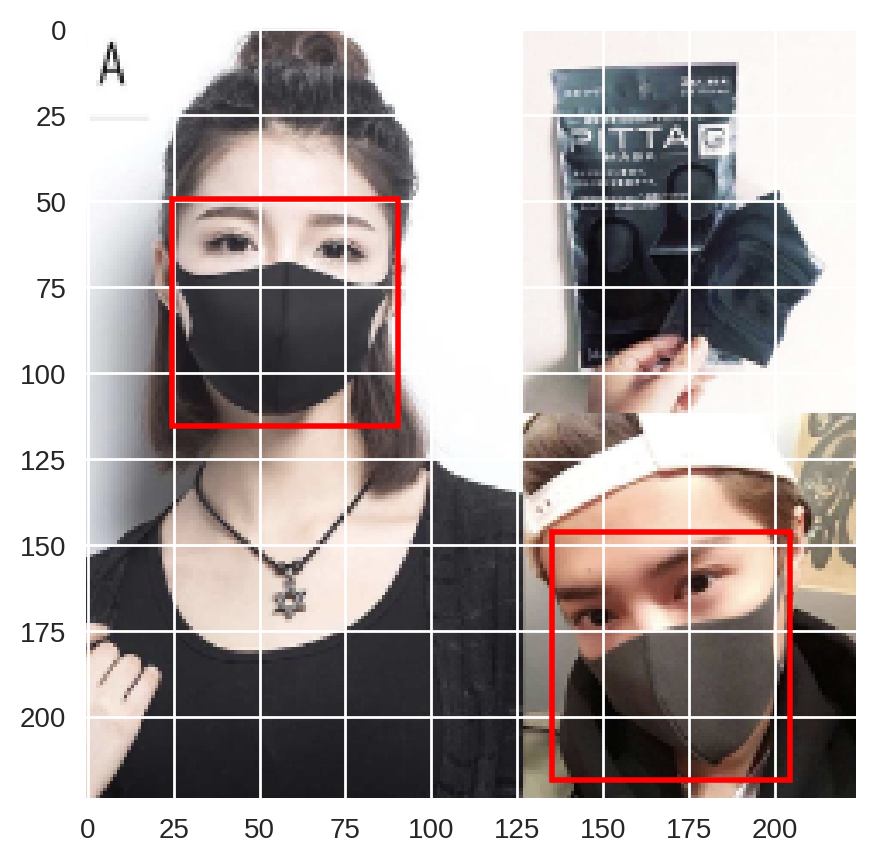

In [15]:
img, target = dataset[random.randint(1,len(dataset))]
plot_img_bbox(img, target)

### 3.2. Функции для обучения модели

Напишем функции необходимые для обучения модели:

In [16]:
def get_model_instance_segmentation(num_classes):
    """
    Функция загружает предобученную модель Faster RCNN и правит классификатор,
    с учетом необходимого количества классов, принятых на вход.
    """
    model = torchvision.models.detection.fasterrcnn_resnet50_fpn(weigts=True)
    in_features = model.roi_heads.box_predictor.cls_score.in_features
    model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)

    return model

In [17]:
def intersection_over_union(dt_bbox: np.array, gt_bbox: np.array) -> float:
    """
    Функция принимает на вход 2 массива с координатами bbox, где
    dt_bbox - предсказанные координаты
    gt_bbox - реальные координаты
    Функция возвращает IOU (Intersection Over Union)

    Intersection over Union между 2 bboxes
    (x0, y0) - координаты верхнего левого угла
    (x1, y1) - координаты нижнего правого угла

    :param dt_bbox: список или массив размерности (4,) [x0, y0, x1, y1]
    :param gt_bbox: список или массив размерности (4,) [x0, y0, x1, y1]
    :return : intersection over union
    """
    # координаты области пересечения
    ix1 = np.maximum(gt_bbox[0], dt_bbox[0])
    iy1 = np.maximum(gt_bbox[1], dt_bbox[1])
    ix2 = np.minimum(gt_bbox[2], dt_bbox[2])
    iy2 = np.minimum(gt_bbox[3], dt_bbox[3])

    # высота и ширина пересечения
    i_height = np.maximum(iy2 - iy1 + 1, np.array(0.))
    i_width = np.maximum(ix2 - ix1 + 1, np.array(0.))

    area_of_intersection = i_height * i_width

    # размеры реального bbox
    gt_height = gt_bbox[3] - gt_bbox[1] + 1
    gt_width = gt_bbox[2] - gt_bbox[0] + 1

    # размеры предсказанного bbox
    pd_height = dt_bbox[3] - dt_bbox[1] + 1
    pd_width = dt_bbox[2] - dt_bbox[0] + 1

    area_of_union = gt_height * gt_width + pd_height * pd_width - area_of_intersection

    iou = area_of_intersection / area_of_union

    return iou

In [18]:
def evaluate_sample(target_pred: torch.Tensor, target_true, iou_threshold=0.5):
    """
    Функция получает предсказание и реальное значение сэмпла, рассчитывает пересечения
    предсказаных и реальных bbox с учетом порога IoU (=0.5 по умолчанию), возращает результат и
    IoU (общий).
    """
    # правильные прямоугольники
    gt_bboxes = target_true["boxes"].numpy()
    gt_labels = target_true["labels"].numpy()

    # предсказания модели
    dt_bboxes = target_pred["boxes"].numpy()
    dt_labels = target_pred["labels"].numpy()
    dt_scores = target_pred["scores"].numpy()

    # результаты пересечений bbox
    results = []
    # полученные IoU
    IoU_total = []
    # для каждого прямоугольника из предсказания находим максимально близкий прямоугольник среди ответов
    for detection_id in range(len(dt_labels)):
        dt_bbox = dt_bboxes[detection_id, :]
        dt_label = dt_labels[detection_id]
        dt_score = dt_scores[detection_id]

        detection_result_dict = {"score": dt_score}

        max_IoU = 0
        max_gt_id = -1
        for gt_id in range(len(gt_labels)):
            gt_bbox = gt_bboxes[gt_id, :]
            gt_label = gt_labels[gt_id]

            if gt_label != dt_label:
                continue

            if intersection_over_union(dt_bbox, gt_bbox) > max_IoU:
                max_IoU = intersection_over_union(dt_bbox, gt_bbox)
                max_gt_id = gt_id

        if max_gt_id >= 0 and max_IoU >= iou_threshold:
            # для прямоугольника detection_id нашли правильный ответ, который имеет IoU больше 0.5
            detection_result_dict["TP"] = 1
            # удаляем эти прямоугольники из данных, чтобы больше не матчить с ними
            gt_labels = np.delete(gt_labels, max_gt_id, axis=0)
            gt_bboxes = np.delete(gt_bboxes, max_gt_id, axis=0)

        else:
            detection_result_dict["TP"] = 0

        results.append(detection_result_dict)
        IoU_total.append(intersection_over_union(dt_bbox, gt_bbox))

    # возвращаем результат + IoU, для кажого прямоугольника говорим, смогли ли сматчить его с чем то из ответов
    return results, IoU_total

In [19]:
def evaluate(model, test_loader, device):
    """
    Функция принимает на вход модель, валидационный(тестовый) даталоадер, устройство;
    проходится по батчам, разбивая батч на сэмплы, и используя функцию evaluate_sample
    получает результаты по пересечению bbox и IoU по каждому сэмплу. Затем производит расчет
    метрик mAP, precision, recall и возращает их вместе с результатами IoU.
    """
    results = []
    IoU_total =[]
    model.eval()
    nbr_boxes = 0
    with torch.no_grad():
        for batch, (images, targets_true) in enumerate(test_loader):
            images = list(image.to(device).float() for image in images)
            targets_pred = model(images)

            targets_true = [
                {k: v.cpu().float() for k, v in t.items()} for t in targets_true
            ]
            targets_pred = [
                {k: v.cpu().float() for k, v in t.items()} for t in targets_pred
            ]

            for i in range(len(targets_true)):
                target_true = targets_true[i]
                target_pred = targets_pred[i]
                nbr_boxes += target_true["labels"].shape[0]

                # матчим ответы с правильными боксами, сохраняем IoU
                results.extend(evaluate_sample(target_pred, target_true)[0])
                IoU_total.extend(evaluate_sample(target_pred, target_true)[1])

    results = sorted(results, key=lambda k: k["score"], reverse=True)

    # считаем точность и полноту, чтобы потом посчитать mAP как auc
    acc_TP = np.zeros(len(results))
    acc_FP = np.zeros(len(results))
    recall = np.zeros(len(results))
    precision = np.zeros(len(results))

    if results[0]["TP"] == 1:
        acc_TP[0] = 1
    else:
        acc_FP[0] = 1

    for i in range(1, len(results)):
        acc_TP[i] = results[i]["TP"] + acc_TP[i - 1]
        acc_FP[i] = (1 - results[i]["TP"]) + acc_FP[i - 1]

        precision[i] = acc_TP[i] / (acc_TP[i] + acc_FP[i])
        recall[i] = acc_TP[i] / nbr_boxes

    # возвращаем mAP (как auc), precision, recall, IoU
    return auc(recall, precision), precision, recall, IoU_total

In [22]:
def train_one_epoch(model, optimizer, data_loader, device):
    """
    Функция принимает на вход модель, оптимайзер, даталоадер для обучения и устройство,
    проводит обучение модели на 1 эпохе, возвращая loss.
    """
    model.train()
    global_loss = 0
    for images, targets in tqdm(data_loader, leave=False, desc="Batch number"):
        images = list(image.to(device).float() for image in images)
        targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

        dict_loss = model(images, targets)
        losses = sum(loss for loss in dict_loss.values())

        optimizer.zero_grad()
        losses.backward()
        optimizer.step()

        global_loss += float(losses.cpu().detach().numpy())

    return global_loss


def train(model, train_loader, test_loader, optimizer, device, num_epochs=3):
    """
    Функция прнимает на вход модель, тренировочный и тестовый(валидационный) даталоадеры,
    оптимайзер, устройство и количество эпох обучения. На каждой эпохе происходит обучение
    на тренировочной выборке и валидация (используются функции train_one_epoch и evaluate),
    получая train_loss, а также mAP, precision, recall, IoU на валидации.
    Полученные метрики визуализируются в виде диаграмм.
    """
    # списки с результатами метрик на каждой эпохе
    mAP_plot = []
    precision_plot = []
    recall_plot = []
    IoU_mean_plot = []
    IoU_min_plot = []
    IoU_max_plot = []
    # список с количеством предсказанных bbox на каждой эпохе
    bbox_number_plot = []

    for epoch in trange(num_epochs, leave=True, desc=f"Epoch number"):
        loss_train = train_one_epoch(model, optimizer, train_loader, device)
        mAP, precision_total, recall_total, IoU_total = evaluate(model, test_loader, device=device)

        # получаем итоговые метрики
        precision = np.mean(precision_total)
        recall = np.mean(recall_total)
        IoU_mean = np.mean(IoU_total)
        IoU_min = np.min(IoU_total)
        IoU_max = np.max(IoU_total)

        # добавляем метрики текущей эпохи в списки
        precision_plot.append(precision)
        recall_plot.append(recall)
        IoU_mean_plot.append(IoU_mean)
        IoU_min_plot.append(IoU_min)
        IoU_max_plot.append(IoU_max)
        mAP_plot.append(mAP)
        bbox_number_plot.append(len(IoU_total))

        # выводим метрики
        print(f"\n** Epoch {epoch + 1} **")
        print("Train:")
        print(colorama.Fore.BLACK, f" loss_train after epoch {epoch + 1} is {loss_train:.2f}")
        print("Valid:")
        print(colorama.Fore.BLACK, f" mAP after epoch {epoch + 1} is {mAP:.2f}")
        print(colorama.Fore.RED, f" precision after epoch {epoch + 1} is {precision:.2f}")
        print(colorama.Fore.BLUE, f" recall after epoch {epoch + 1} is {recall:.2f}")
        print(colorama.Fore.GREEN, f" IoU_mean after epoch {epoch + 1} is {IoU_mean:.2f}")
        print(colorama.Fore.GREEN, f" IoU_min after epoch {epoch + 1} is {IoU_min:.2f}")
        print(colorama.Fore.GREEN, f" IoU_max after epoch {epoch + 1} is {IoU_max:.2f}")

    # визуализируем результаты
    plt.figure(figsize=(18, 4))

    plt.subplot(131)
    plt.plot(range(1, len(mAP_plot) + 1), mAP_plot, color="k")
    plt.plot(range(1, len(precision_plot) + 1), precision_plot, color="b")
    plt.plot(range(1, len(recall_plot) + 1), recall_plot, color="r")
    plt.xlabel("Номер эпохи")
    plt.legend(['mAP', 'Precision', 'Recall'], loc='best')
    plt.title("mAP, Precision и Recall на валидации")

    plt.subplot(132)
    plt.plot(range(1, len(IoU_mean_plot) + 1), IoU_mean_plot, color="k")
    plt.plot(range(1, len(IoU_min_plot) + 1), IoU_min_plot, color="m")
    plt.plot(range(1, len(IoU_max_plot) + 1), IoU_max_plot, color="c")
    plt.xlabel("Номер эпохи")
    plt.legend(['IoU_mean', 'IoU_min', 'IoU_max'], loc='best')
    plt.title("IoU на валидации")

    plt.subplot(133)
    plt.plot(range(1, len(bbox_number_plot) + 1), bbox_number_plot, color="k")
    plt.xlabel("Номер эпохи")
    plt.title("Кол-во предсказанных bbox на валидации")


    plt.show()

### 3.3. Обучение модели, получение метрик

In [21]:
# зададим устройство
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')

# определим количество классов
num_classes = 4

# определим модель для обучения, с учетом количества классов
model = get_model_instance_segmentation(num_classes)

# зададим количество эпох
num_epochs = 1

# зададим дополнительные параметры
params = [p for p in model.parameters() if p.requires_grad]
optimizer = torch.optim.SGD(params, lr=0.005,
                                momentum=0.9, weight_decay=0.0005)

# перенесем модель на наше устройство
model = model.to(device)

Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 171MB/s]


Обучаем модель:

Epoch number:   0%|          | 0/20 [00:00<?, ?it/s]

Batch number:   0%|          | 0/68 [00:00<?, ?it/s]


** Epoch 1 **
Train:
  loss_train after epoch 1 is 50.57
Valid:
  mAP after epoch 1 is 0.19
  precision after epoch 1 is 0.11
  recall after epoch 1 is 0.54
  IoU_mean after epoch 1 is 0.10
  IoU_min after epoch 1 is 0.00
  IoU_max after epoch 1 is 0.95


Batch number:   0%|          | 0/68 [00:00<?, ?it/s]


** Epoch 2 **
Train:
  loss_train after epoch 2 is 37.44
Valid:
  mAP after epoch 2 is 0.52
  precision after epoch 2 is 0.25
  recall after epoch 2 is 0.68
  IoU_mean after epoch 2 is 0.12
  IoU_min after epoch 2 is 0.00
  IoU_max after epoch 2 is 0.97


Batch number:   0%|          | 0/68 [00:00<?, ?it/s]


** Epoch 3 **
Train:
  loss_train after epoch 3 is 32.84
Valid:
  mAP after epoch 3 is 0.74
  precision after epoch 3 is 0.34
  recall after epoch 3 is 0.77
  IoU_mean after epoch 3 is 0.13
  IoU_min after epoch 3 is 0.00
  IoU_max after epoch 3 is 0.96


Batch number:   0%|          | 0/68 [00:00<?, ?it/s]


** Epoch 4 **
Train:
  loss_train after epoch 4 is 27.72
Valid:
  mAP after epoch 4 is 0.80
  precision after epoch 4 is 0.49
  recall after epoch 4 is 0.77
  IoU_mean after epoch 4 is 0.14
  IoU_min after epoch 4 is 0.00
  IoU_max after epoch 4 is 0.96


Batch number:   0%|          | 0/68 [00:00<?, ?it/s]


** Epoch 5 **
Train:
  loss_train after epoch 5 is 25.10
Valid:
  mAP after epoch 5 is 0.83
  precision after epoch 5 is 0.55
  recall after epoch 5 is 0.76
  IoU_mean after epoch 5 is 0.14
  IoU_min after epoch 5 is 0.00
  IoU_max after epoch 5 is 0.95


Batch number:   0%|          | 0/68 [00:00<?, ?it/s]


** Epoch 6 **
Train:
  loss_train after epoch 6 is 23.15
Valid:
  mAP after epoch 6 is 0.83
  precision after epoch 6 is 0.62
  recall after epoch 6 is 0.73
  IoU_mean after epoch 6 is 0.15
  IoU_min after epoch 6 is 0.00
  IoU_max after epoch 6 is 0.95


Batch number:   0%|          | 0/68 [00:00<?, ?it/s]


** Epoch 7 **
Train:
  loss_train after epoch 7 is 21.70
Valid:
  mAP after epoch 7 is 0.83
  precision after epoch 7 is 0.68
  recall after epoch 7 is 0.71
  IoU_mean after epoch 7 is 0.17
  IoU_min after epoch 7 is 0.00
  IoU_max after epoch 7 is 0.97


Batch number:   0%|          | 0/68 [00:00<?, ?it/s]


** Epoch 8 **
Train:
  loss_train after epoch 8 is 20.46
Valid:
  mAP after epoch 8 is 0.85
  precision after epoch 8 is 0.71
  recall after epoch 8 is 0.71
  IoU_mean after epoch 8 is 0.16
  IoU_min after epoch 8 is 0.00
  IoU_max after epoch 8 is 0.97


Batch number:   0%|          | 0/68 [00:00<?, ?it/s]


** Epoch 9 **
Train:
  loss_train after epoch 9 is 19.04
Valid:
  mAP after epoch 9 is 0.83
  precision after epoch 9 is 0.56
  recall after epoch 9 is 0.77
  IoU_mean after epoch 9 is 0.13
  IoU_min after epoch 9 is 0.00
  IoU_max after epoch 9 is 0.97


Batch number:   0%|          | 0/68 [00:00<?, ?it/s]


** Epoch 10 **
Train:
  loss_train after epoch 10 is 18.33
Valid:
  mAP after epoch 10 is 0.86
  precision after epoch 10 is 0.70
  recall after epoch 10 is 0.73
  IoU_mean after epoch 10 is 0.16
  IoU_min after epoch 10 is 0.00
  IoU_max after epoch 10 is 0.96


Batch number:   0%|          | 0/68 [00:00<?, ?it/s]


** Epoch 11 **
Train:
  loss_train after epoch 11 is 17.17
Valid:
  mAP after epoch 11 is 0.86
  precision after epoch 11 is 0.76
  recall after epoch 11 is 0.69
  IoU_mean after epoch 11 is 0.19
  IoU_min after epoch 11 is 0.00
  IoU_max after epoch 11 is 0.96


Batch number:   0%|          | 0/68 [00:00<?, ?it/s]


** Epoch 12 **
Train:
  loss_train after epoch 12 is 16.09
Valid:
  mAP after epoch 12 is 0.86
  precision after epoch 12 is 0.72
  recall after epoch 12 is 0.72
  IoU_mean after epoch 12 is 0.16
  IoU_min after epoch 12 is 0.00
  IoU_max after epoch 12 is 0.97


Batch number:   0%|          | 0/68 [00:00<?, ?it/s]


** Epoch 13 **
Train:
  loss_train after epoch 13 is 14.72
Valid:
  mAP after epoch 13 is 0.86
  precision after epoch 13 is 0.76
  recall after epoch 13 is 0.70
  IoU_mean after epoch 13 is 0.17
  IoU_min after epoch 13 is 0.00
  IoU_max after epoch 13 is 0.97


Batch number:   0%|          | 0/68 [00:00<?, ?it/s]


** Epoch 14 **
Train:
  loss_train after epoch 14 is 14.40
Valid:
  mAP after epoch 14 is 0.87
  precision after epoch 14 is 0.77
  recall after epoch 14 is 0.70
  IoU_mean after epoch 14 is 0.19
  IoU_min after epoch 14 is 0.00
  IoU_max after epoch 14 is 0.98


Batch number:   0%|          | 0/68 [00:00<?, ?it/s]


** Epoch 15 **
Train:
  loss_train after epoch 15 is 13.56
Valid:
  mAP after epoch 15 is 0.86
  precision after epoch 15 is 0.73
  recall after epoch 15 is 0.71
  IoU_mean after epoch 15 is 0.15
  IoU_min after epoch 15 is 0.00
  IoU_max after epoch 15 is 0.95


Batch number:   0%|          | 0/68 [00:00<?, ?it/s]


** Epoch 16 **
Train:
  loss_train after epoch 16 is 12.82
Valid:
  mAP after epoch 16 is 0.84
  precision after epoch 16 is 0.81
  recall after epoch 16 is 0.65
  IoU_mean after epoch 16 is 0.18
  IoU_min after epoch 16 is 0.00
  IoU_max after epoch 16 is 0.95


Batch number:   0%|          | 0/68 [00:00<?, ?it/s]


** Epoch 17 **
Train:
  loss_train after epoch 17 is 13.44
Valid:
  mAP after epoch 17 is 0.86
  precision after epoch 17 is 0.69
  recall after epoch 17 is 0.74
  IoU_mean after epoch 17 is 0.14
  IoU_min after epoch 17 is 0.00
  IoU_max after epoch 17 is 0.98


Batch number:   0%|          | 0/68 [00:00<?, ?it/s]


** Epoch 18 **
Train:
  loss_train after epoch 18 is 11.91
Valid:
  mAP after epoch 18 is 0.86
  precision after epoch 18 is 0.73
  recall after epoch 18 is 0.71
  IoU_mean after epoch 18 is 0.15
  IoU_min after epoch 18 is 0.00
  IoU_max after epoch 18 is 0.96


Batch number:   0%|          | 0/68 [00:00<?, ?it/s]


** Epoch 19 **
Train:
  loss_train after epoch 19 is 12.02
Valid:
  mAP after epoch 19 is 0.86
  precision after epoch 19 is 0.84
  recall after epoch 19 is 0.64
  IoU_mean after epoch 19 is 0.20
  IoU_min after epoch 19 is 0.00
  IoU_max after epoch 19 is 0.97


Batch number:   0%|          | 0/68 [00:00<?, ?it/s]


** Epoch 20 **
Train:
  loss_train after epoch 20 is 10.87
Valid:
  mAP after epoch 20 is 0.87
  precision after epoch 20 is 0.86
  recall after epoch 20 is 0.64
  IoU_mean after epoch 20 is 0.20
  IoU_min after epoch 20 is 0.00
  IoU_max after epoch 20 is 0.98


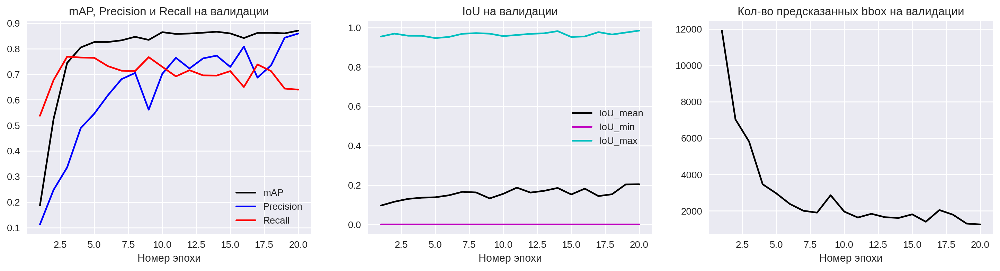

In [23]:
train(model, data_loader_train, data_loader_valid, optimizer, device, num_epochs=20)

### 3.4. Визуализируем полученные результаты

Зададим необходимые функции:

In [24]:
def apply_nms(orig_prediction, iou_thresh=0.3):
    """
    Функция принимает на вход исходный прогноз модели и порог IoU,
    возвращает окончательный прогноз, отфильтрованный по порогу IoU
    """

    keep = torchvision.ops.nms(orig_prediction['boxes'], orig_prediction['scores'], iou_thresh)

    final_prediction = orig_prediction
    final_prediction['boxes'] = final_prediction['boxes'][keep]
    final_prediction['scores'] = final_prediction['scores'][keep]
    final_prediction['labels'] = final_prediction['labels'][keep]

    return final_prediction

def torch_to_pil(img):
    """ Функция преобразует тензор в изображение """
    return transforms.ToPILImage()(img).convert('RGB')

Возьмем случайное изображение из валидационного датасета:

In [25]:
img, target = dataset_valid[random.randint(1,len(dataset_valid))]

model.eval()
with torch.no_grad():
    prediction = model([img.to(device)])[0]

print('Количество предсказанных bbox на изображении: ', len(prediction['labels']))
print('Реальное количество bbox на изображении: ', len(target['labels']))

Количество предсказанных bbox на изображении:  4
Реальное количество bbox на изображении:  2


Выведем дополнительно это изображение с реальными и предсказанными bbox:

РЕАЛЬНЫЙ РЕЗУЛЬТАТ


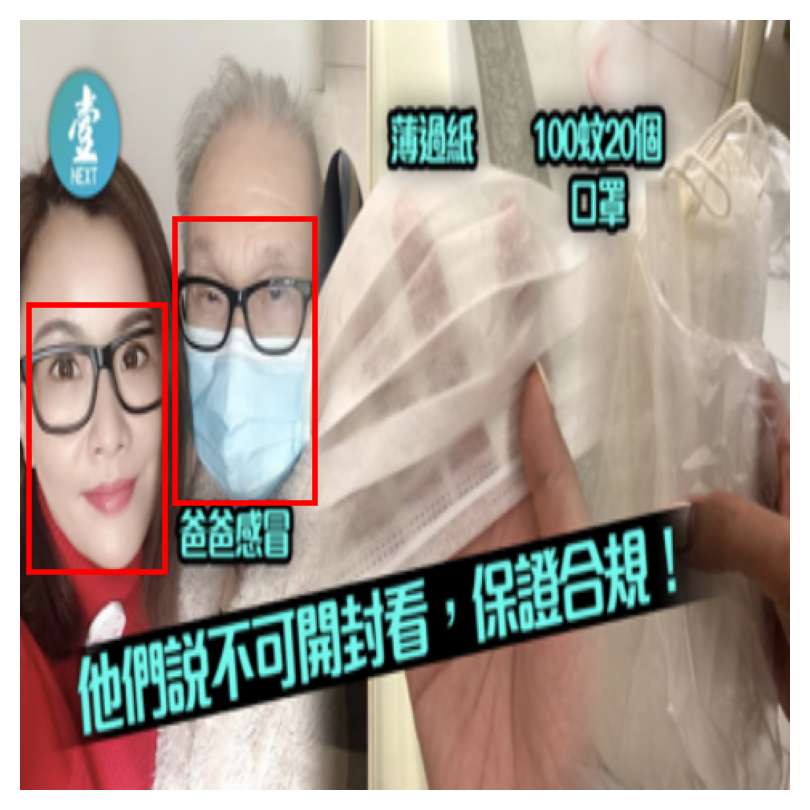

ПРЕДСКАЗАНИЕ МОДЕЛИ


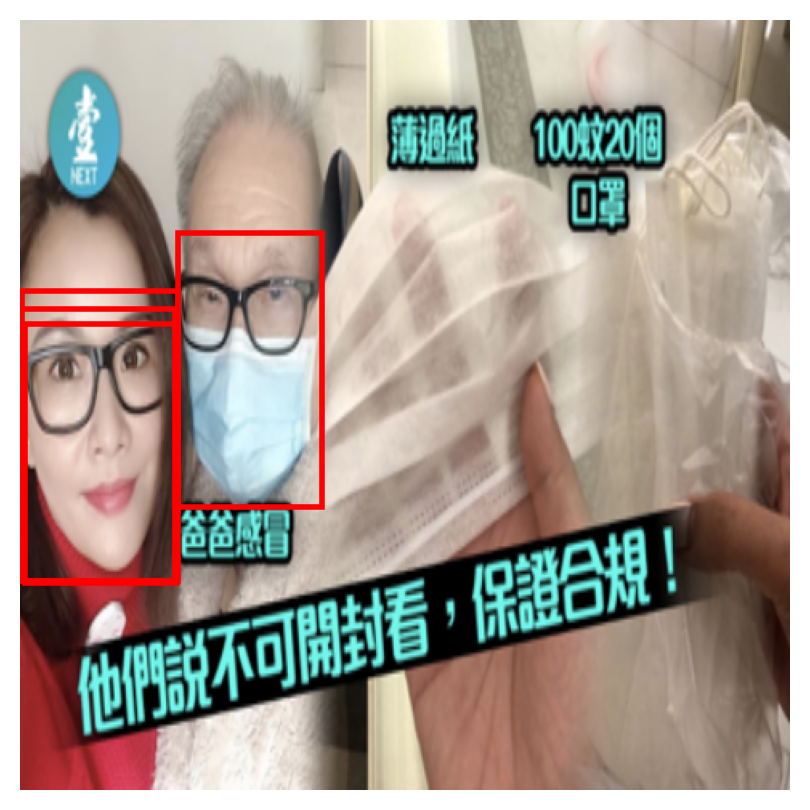

In [26]:
print('РЕАЛЬНЫЙ РЕЗУЛЬТАТ')
plot_img_bbox(torch_to_pil(img), target, ticks=False)
print('ПРЕДСКАЗАНИЕ МОДЕЛИ')
plot_img_bbox(torch_to_pil(img), prediction, ticks=False)

Повторно выведем предсказание модели, но отфильтруем по уровню IoU:

NMS ПРЕДСКАЗАНИЕ МОДЕЛИ


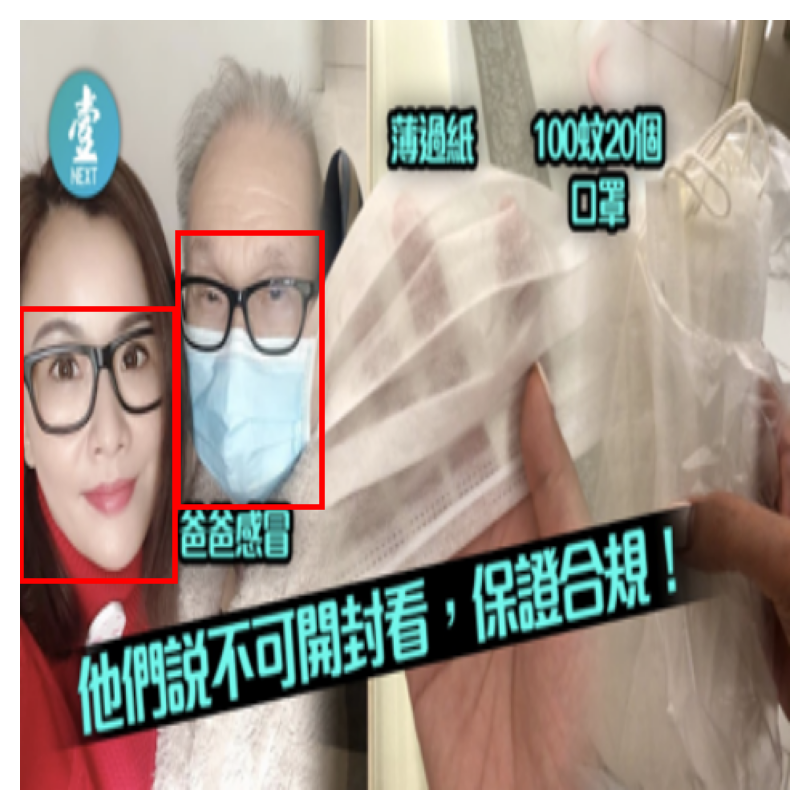

In [27]:
nms_prediction = apply_nms(prediction, iou_thresh=0.1)
print('NMS ПРЕДСКАЗАНИЕ МОДЕЛИ')
plot_img_bbox(torch_to_pil(img), nms_prediction, ticks=False)

Теперь возьмем даталоадер для валидации, извлечем изображение с реальными bbox и метками и получим предсказание модели с bbox и с вероятностями классов:

In [28]:
def plot_image(img_tensor, annotation, predict=True):
    """
    Функция принимает на вход изображение (тензор), реальный или предсказанный таргет,
    значение predict (для предсказанного таргета значение должно быть True).
    Возвращает изображение с bbox и метками классов (для предсказанного таргета с вероятностями).
    """

    # словарь с метками классов
    mask_dic = {1:'without_mask', 2:'with_mask', 3:'mask_weared_incorrect'}

    # перемещаем в память процессора
    img = img_tensor.cpu().data
    annotation["boxes"] = annotation["boxes"].cpu().data
    annotation['labels'] = annotation['labels'].cpu().data

    # Визуализация
    fig,ax = plt.subplots(1)
    fig.set_size_inches(18.5, 10.5)

    ax.imshow(img.permute(1, 2, 0))

    for i,box in enumerate(annotation["boxes"]):
        xmin, ymin, xmax, ymax = box

        # Формируем рамку
        rect = patches.Rectangle((xmin,ymin),(xmax-xmin),(ymax-ymin),linewidth=1,edgecolor='r',facecolor='none')

        # добавляем рамку и метку класса
        ax.add_patch(rect)
        label = mask_dic[int(annotation['labels'][i].data)]
        if predict:
            # + вероятности
            annotation['scores'] = annotation['scores'].cpu().data
            score = int((annotation['scores'][i].data) * 100)
            ax.text(xmin, ymin, f"{label} : {score}%", horizontalalignment='center', verticalalignment='center',fontsize=20,color='b')
        else:
            score=''
            ax.text(xmin, ymin, f"{label}", horizontalalignment='center', verticalalignment='center',fontsize=20,color='b')
    plt.show()

Получим первый батч из валидационного даталоадера:

In [29]:
for imgs, annotations in data_loader_valid:
        imgs = list(img.to(device) for img in imgs)
        annotations = [{k: v.to(device) for k, v in t.items()} for t in annotations]
        break

Выполним предсказание на обученной модели:

In [30]:
model.eval()
preds = model(imgs)

Возьмем, в данном случае, 5-й сэмпл из батча: само изображение, реальные bbox и метки классов (отрисуем на первом изображении) и предсказанные bbox, метки классов и их вероятности (+ фильтр по уровню IoU) и отрисуем их на втором изображении:

Prediction


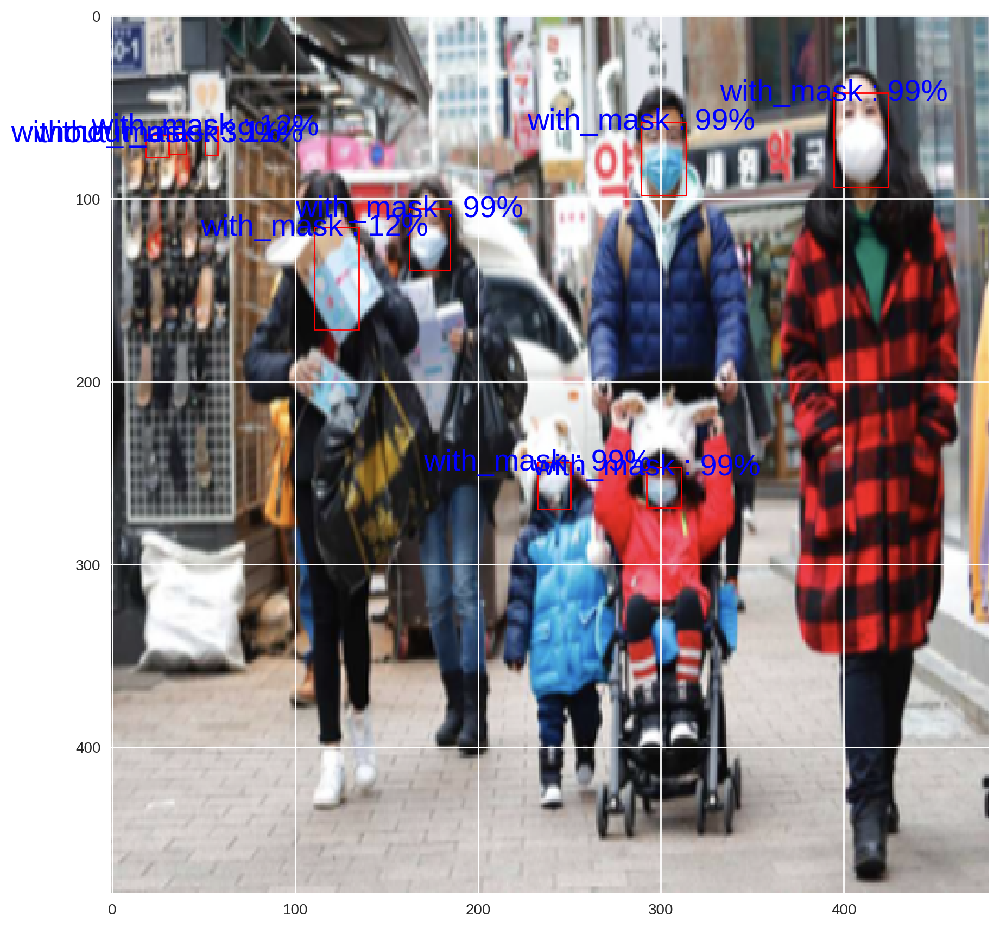

Target


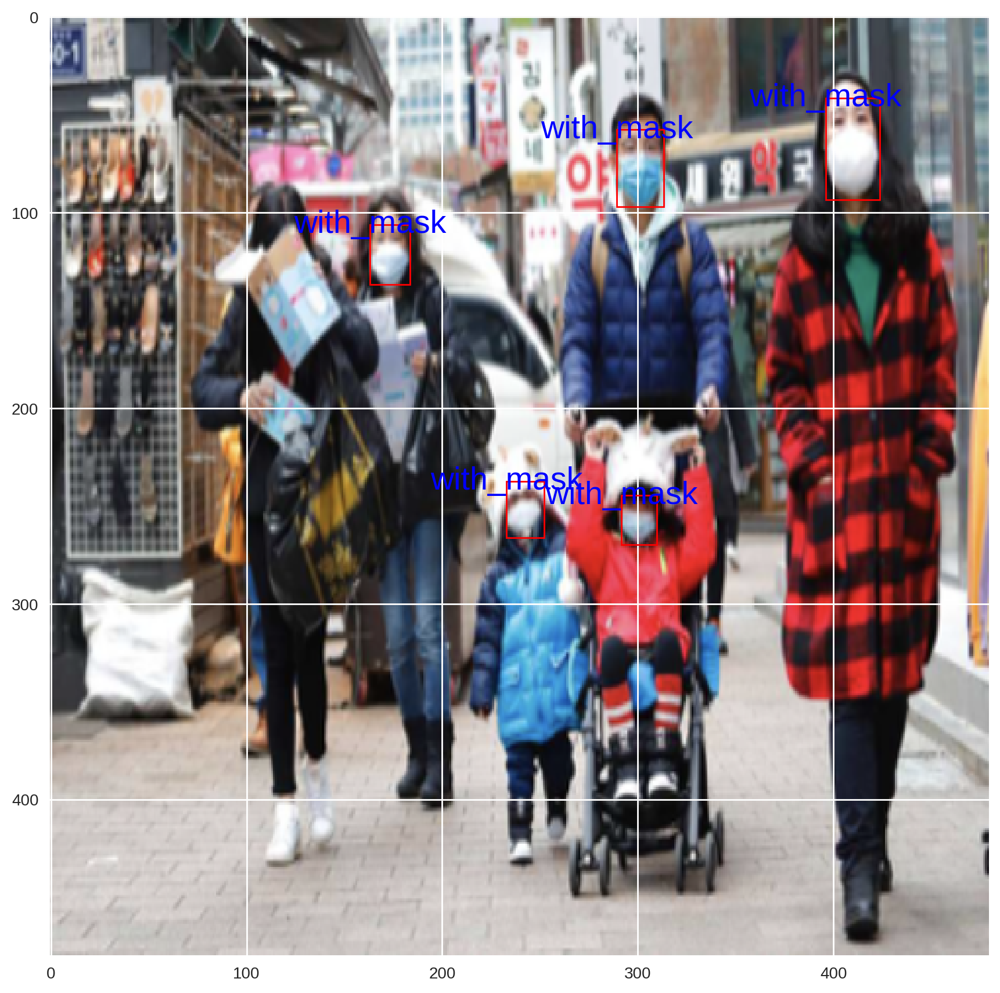

In [31]:
nms_prediction = apply_nms(preds[4], iou_thresh=0.1)
print("Prediction")
plot_image(imgs[4], nms_prediction)

print("Target")
plot_image(imgs[4], annotations[4], predict=False)

**Выводы:**
- мы получили значение mAP (в данном случае mAP_50) >0.85, выполнив задачу
- обнаружено, что модель склонна предсказывать количество bbox значительно больше их реального количества, хотя эта склонность снижается с увеличением количества эпох обучения
- но в то же время, с самых первых эпох мы видим предсказаные bbox IoU которых > 0.9
- использование фильтра по уровню IoU позволяет улучшить результаты предсказаний
- модель достаточно ресурсоемка и требует большого времени для дообучения

## 4. YOLO

### 4.1. Установим и импортируем дополнительные модули и библиотеки

In [32]:
!pip install -q ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 715.0/715.0 kB 12.6 MB/s eta 0:00:00


In [63]:
from ultralytics import YOLO

from sklearn import preprocessing
from sklearn.model_selection import train_test_split

from IPython.display import display, Image

import shutil

### 4.2. Подготовим данные

Напишем функцияю для обработки аннотаций к файлам изображений и сведение названий файлов и их аннотаций в одну таблицу:

In [34]:
def xml_to_csv(path = 'data/annotations/'):
    """
    Функция принимает на вход путь к файлам аннотаций (*.xml),
    возвращает датафрейм с названиями файлов, размерностью по 3 осям,
    названием класса, координаты рамки (bbox).
    """
    xml_list = []
    for xml_file in tqdm(glob.glob(path + '/*.xml')):
        tree = et.parse(xml_file)
        root = tree.getroot()
        for obj in root.findall('object'):
            bbx = obj.find('bndbox')
            xmin = int(bbx.find('xmin').text)
            ymin = int(bbx.find('ymin').text)
            xmax = int(bbx.find('xmax').text)
            ymax = int(bbx.find('ymax').text)
            label = obj.find('name').text

            value = (root.find('filename').text,

                     # последовательность осей!
                     int(root.find('size')[2].text),
                     int(root.find('size')[0].text),
                     int(root.find('size')[1].text),

                     label,
                     xmin,
                     ymin,
                     xmax,
                     ymax
                     )
            xml_list.append(value)
    column_name = ['filename', 'channels', 'width', 'height',
                   'class', 'xmin', 'ymin', 'xmax', 'ymax']
    xml_df = pd.DataFrame(xml_list, columns=column_name)
    return xml_df

In [35]:
xml_df = xml_to_csv()
xml_df.to_csv('project_dataset.csv', index=None)
print('Конвертация прошла успешно.')

  0%|          | 0/842 [00:00<?, ?it/s]

Конвертация прошла успешно.


Ознакомимся с полученной таблицей:

In [36]:
display(xml_df.head())
print(f'Общее количество объектов {xml_df.shape[0]}')
print(f'Количество изображений в датафрэйме {len(np.unique(xml_df["filename"]))}')

,filename,channels,width,height,class,xmin,ymin,xmax,ymax
0,maksssksksss726.png,3,400,254,without_mask,188,67,207,89
1,maksssksksss726.png,3,400,254,with_mask,256,63,277,85
2,maksssksksss726.png,3,400,254,without_mask,312,89,325,105
3,maksssksksss726.png,3,400,254,without_mask,356,77,369,96
4,maksssksksss292.png,3,400,300,with_mask,189,88,220,125


Общее количество объектов 3827
Количество изображений в датафрэйме 842


**Примечание:** очевидно, что на одном изображении может быть несколько объектов, что и отражено в результатах запроса.

Теперь закодируем метки классов и составим словарь меток (он нам понадобится ниже):

In [37]:
le = preprocessing.LabelEncoder()
xml_df['class'] = le.fit_transform(xml_df['class'])
mapping = dict(zip(le.classes_, range(len(le.classes_))))
mapping

{'mask_weared_incorrect': 0, 'with_mask': 1, 'without_mask': 2}

Теперь преобразуем формат аннотаций нашего датасета в формат аннотаций YOLO:

In [38]:
def convert_to_yolov5(df, unique_img_names):
    """
    Функция принимает на вход датафрейм с информацией о файлах картинок:
    имя файла, размерность по 3 осям, метка класса, координаты ограничительной рамки (bbox),
    и уникальные имена файлов с картинками (т.к. одна картинка может содержать несколько объектов).
    Функция преобразует аннотации, полученные из датафрейма в формат для модели YOLO и сохраняет их
    на диск в виде файлов.
    """

    df_array = np.array(df)

    # Для каждого объкта
    for i in range(len(df)):
        print_buffer = []

        point =  df_array[i]
        img_name = point[0]

        # Для каждого уникального изображения
        for unique_img_name in unique_img_names:
           if img_name == unique_img_name:
              class_id = point[4]

              # Преобразуем координаты bbox
              X = (point[5] + point[7]) / 2
              Y = (point[6] + point[8]) / 2
              Width    = (point[7] - point[5])
              Height   = (point[8] - point[6])

              # Нормализуем координаты
              image_c, image_w, image_h = point[1], point[2], point[3]
              X /= image_w
              Y /= image_h
              Width    /= image_w
              Height   /= image_h

              # Запишем информацию о bbox в файл
              print_buffer.append("{} {:.3f} {:.3f} {:.3f} {:.3f}".format(class_id, X, Y, Width, Height))

        # Дадим имя файлам, которые хотим сохранить
        save_file_name = os.path.join("/content/data/images", img_name.replace("png", "txt"))

        # Сохраним аннотации на диск
        print("\n".join(print_buffer), file= open(save_file_name, "w"))

In [39]:
# Для начала выделим список уникальных имен изображений
unique_img_names = xml_df['filename'].unique()
print(len(unique_img_names))

842


In [40]:
# Получим аннотации в новом формате
convert_to_yolov5(xml_df, unique_img_names)

Теперь попробуем визуализировать наши данные:

In [41]:
class_id_to_name_mapping = dict(zip(mapping.values(), mapping.keys()))

In [42]:
def plot_bounding_box(image, annotation_list):
    """
    Функция принимает на вход изображение и аннотации к ней,
    выводит изображение и ограничительные рамки для объекта,
    а также название класса объекта.
    """

    annotations = np.array(annotation_list)
    w, h = image.size

    plotted_image = ImageDraw.Draw(image)

    transformed_annotations = np.copy(annotations)
    print(transformed_annotations)
    transformed_annotations[:,[1,3]] = annotations[:,[1,3]] * w
    transformed_annotations[:,[2,4]] = annotations[:,[2,4]] * h

    transformed_annotations[:,1] = transformed_annotations[:,1] - (transformed_annotations[:,3] / 2)
    transformed_annotations[:,2] = transformed_annotations[:,2] - (transformed_annotations[:,4] / 2)
    transformed_annotations[:,3] = transformed_annotations[:,1] + transformed_annotations[:,3]
    transformed_annotations[:,4] = transformed_annotations[:,2] + transformed_annotations[:,4]

    for ann in transformed_annotations:
        obj_cls, x0, y0, x1, y1 = ann
        plotted_image.rectangle(((x0,y0), (x1,y1)))

        plotted_image.text((x0, y0 - 10), class_id_to_name_mapping[(int(obj_cls))], fill="#000")

    plt.xticks([])
    plt.yticks([])
    plt.imshow(np.array(image))
    plt.show()

In [45]:
# Выберем рандомную аннотацию
annotation_random= !ls /content/data/images/*txt | shuf -n 1

[[          1       0.866       0.288       0.052       0.057]]


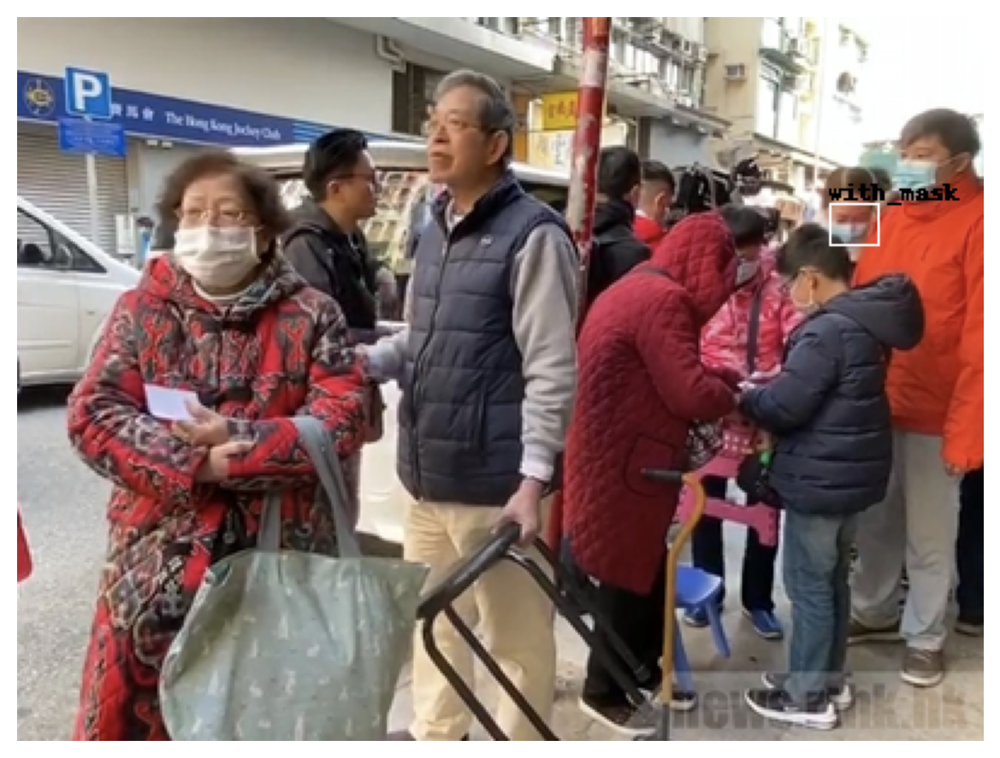

In [46]:
# Выберем рандомную аннотацию
annotation_file = annotation_random[0]
with open(annotation_file, "r") as file:
    annotation_list = file.read().split("\n")[:-1]
    annotation_list = [x.split(" ") for x in annotation_list]
    annotation_list = [[float(y) for y in x ] for x in annotation_list]

# получаем связанный файл изображения
image_file = annotation_file.replace("txt", "png")
assert os.path.exists(image_file)

# загружаем изображение
image = Image.open(image_file)

# выводим изображение с bbox
plot_bounding_box(image, annotation_list)

На полученном изображении мы отметили 1 bbox с классом "with_mask"

У нас есть проблема: файлы изображений и их аннотаций находятся в одной папке. Кроме того, нужно разделить выборку на тренировочную и валидационную. А также необходимо создать (или загрузить готовый) файл .yaml нашего датасета, который пойдет в модель YOLO.

In [47]:
# считываем изображения и новый аннотации
images = [os.path.join('data/images', x) for x in os.listdir('data/images') if x[-3:] == "png"]
annotations = [os.path.join('data/images', x) for x in os.listdir('data/images') if x[-3:] == "txt"]

# сортируем
images.sort()
annotations.sort()

# сплитуем датасет
train_images, val_images, train_annotations, val_annotations = train_test_split(images, annotations, test_size = 0.2, random_state = 1)


In [48]:
# создаем новые папки, согласно документации YOLO
pathes = [
    "data_yolo", "data_yolo/images", "data_yolo/labels",
    "data_yolo/images/train", "data_yolo/images/val",
    "data_yolo/labels/train", "data_yolo/labels/val"
    ]
for path in pathes:
    os.mkdir(path)

In [49]:
# функция для копирования изображений в папки
def move_files_to_folder(list_of_files, destination_folder):
    for f in list_of_files:
        try:
            shutil.move(f, destination_folder)
        except:
            print(f)
            assert False

# раскидываем файлы полученных выборок по соотвествующим папкам
move_files_to_folder(train_images, 'data_yolo/images/train/')
move_files_to_folder(val_images, 'data_yolo/images/val/')
move_files_to_folder(train_annotations, 'data_yolo/labels/train/')
move_files_to_folder(val_annotations, 'data_yolo/labels/val/')

Итак, датасет для модели YOLO размещен.в папке `data_yolo`. Осталось добавить .yaml файл - его можно найти на моем GitHub в папке проекта:

In [50]:
# загружаем .yaml файл датасета
%cd '/content/data_yolo'
files.upload()
%cd ../

/content/data_yolo


Saving data_yolo.yaml to data_yolo.yaml
/content


### 4.3. Обучение модели

Попробуем испоьзовать YOLOv8 (последняя версия их модели):

In [51]:
# загружаем предобученную модель
model = YOLO('yolov8n.pt')

# процесс ее обучения
results = model.train(data='/content/data_yolo/data_yolo.yaml', epochs=20, imgsz=640)

100%|██████████| 6.23M/6.23M [00:00<00:00, 197MB/s]

Ultralytics YOLOv8.1.14 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla V100-SXM2-16GB, 16151MiB)


engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/content/data_yolo/data_yolo.yaml, epochs=20, time=None, patience=50, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_boxes=True, line_width=None, format=torchscript, keras=False, optimize=False, int

100%|██████████| 755k/755k [00:00<00:00, 37.3MB/s]


Overriding model.yaml nc=80 with nc=3

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics

/usr/local/lib/python3.10/dist-packages/ultralytics/utils/torch_utils.py:190: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#cublasApi_reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:156.)
  fusedconv.weight.copy_(torch.mm(w_bn, w_conv).view(fusedconv.weight.shape))
/usr/local/lib/python3.10/dist-packages/ultralytics/utils/torch_utils.py:195: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this opera

AMP: checks passed ✅


train: Scanning /content/data_yolo/labels/train... 673 images, 0 backgrounds, 0 corrupt: 100%|██████████| 673/673 [00:01<00:00, 541.55it/s]

train: New cache created: /content/data_yolo/labels/train.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))



val: Scanning /content/data_yolo/labels/val... 169 images, 0 backgrounds, 0 corrupt: 100%|██████████| 169/169 [00:00<00:00, 409.17it/s]


val: New cache created: /content/data_yolo/labels/val.cache
Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001429, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to runs/detect/train
Starting training for 20 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/43 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:191: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#cublasApi_reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:156.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
       1/20      10.8G      1.557      3.786      1.498          4        640: 100%|██████████| 43/43 [00:06<00:00,  6.17it/s]
                 Class     Images  Instances      Box(P          R    

                   all        169        169      0.837      0.158      0.229      0.166



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/43 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:191: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#cublasApi_reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:156.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
       2/20      7.08G      1.271      2.581      1.174          2        640: 100%|██████████| 43/43 [00:04<00:00,  9.40it/s]
                 Class     Images  Instances      Box(P          R    

                   all        169        169      0.847      0.223      0.261      0.185

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/43 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:191: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#cublasApi_reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:156.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
       3/20      7.09G      1.244      2.384      1.195          3        640: 100%|██████████| 43/43 [00:04<00:00,  9.66it/s]
                 Class     Images  Instances      Box(P          R    

                   all        169        169      0.768      0.219      0.245      0.157



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/43 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:191: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#cublasApi_reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:156.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
       4/20      7.09G       1.24      2.263      1.143          3        640: 100%|██████████| 43/43 [00:04<00:00,  9.40it/s]
                 Class     Images  Instances      Box(P          R    

                   all        169        169      0.194       0.34      0.229       0.16

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/43 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:191: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#cublasApi_reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:156.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
       5/20      7.08G      1.335      2.351       1.21          1        640: 100%|██████████| 43/43 [00:04<00:00,  9.55it/s]
                 Class     Images  Instances      Box(P          R    

                   all        169        169      0.802      0.275      0.308      0.212



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/43 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:191: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#cublasApi_reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:156.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
       6/20      7.09G       1.16      1.933      1.132          4        640: 100%|██████████| 43/43 [00:04<00:00,  9.59it/s]
                 Class     Images  Instances      Box(P          R    

                   all        169        169      0.586      0.275      0.321      0.233



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/43 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:191: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#cublasApi_reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:156.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
       7/20      7.09G      1.124      1.717      1.102          1        640: 100%|██████████| 43/43 [00:04<00:00,  9.47it/s]
                 Class     Images  Instances      Box(P          R    

                   all        169        169      0.832      0.262      0.345      0.235

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/43 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:191: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#cublasApi_reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:156.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
       8/20      7.09G      1.126      1.644      1.102          4        640: 100%|██████████| 43/43 [00:04<00:00,  9.53it/s]
                 Class     Images  Instances      Box(P          R    

                   all        169        169      0.386      0.344      0.341      0.253

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/43 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:191: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#cublasApi_reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:156.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
       9/20      7.08G      1.061      1.537      1.072          2        640: 100%|██████████| 43/43 [00:04<00:00,  9.41it/s]
                 Class     Images  Instances      Box(P          R    

                   all        169        169      0.396      0.295      0.378      0.278

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/43 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:191: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#cublasApi_reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:156.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
      10/20      7.08G     0.9832       1.54       1.02          0        640: 100%|██████████| 43/43 [00:04<00:00,  9.83it/s]
                 Class     Images  Instances      Box(P          R    

                   all        169        169      0.351      0.364       0.38      0.292
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/43 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:191: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#cublasApi_reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:156.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
      11/20      7.08G      1.018      1.609      1.036          1        640: 100%|██████████| 43/43 [00:05<00:00,  7.20it/s]
                 Class     Images  Instances      Box(P          R    

                   all        169        169      0.663       0.29      0.412      0.329

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/43 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:191: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#cublasApi_reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:156.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
      12/20      7.08G     0.9752      1.527     0.9978          1        640: 100%|██████████| 43/43 [00:04<00:00,  9.98it/s]
                 Class     Images  Instances      Box(P          R    

                   all        169        169      0.686      0.338      0.397      0.293



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/43 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:191: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#cublasApi_reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:156.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
      13/20      7.08G      0.943      1.452      1.021          1        640: 100%|██████████| 43/43 [00:04<00:00,  9.86it/s]
                 Class     Images  Instances      Box(P          R    

                   all        169        169      0.452      0.441      0.397      0.302



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/43 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:191: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#cublasApi_reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:156.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
      14/20      7.08G     0.9827      1.415      1.014          1        640: 100%|██████████| 43/43 [00:04<00:00,  9.97it/s]
                 Class     Images  Instances      Box(P          R    

                   all        169        169      0.804      0.305      0.397      0.307



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/43 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:191: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#cublasApi_reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:156.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
      15/20      7.08G     0.9193       1.28     0.9979          1        640: 100%|██████████| 43/43 [00:04<00:00,  9.84it/s]
                 Class     Images  Instances      Box(P          R    

                   all        169        169      0.484      0.465      0.463      0.371



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/43 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:191: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#cublasApi_reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:156.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
      16/20      7.08G     0.9285      1.211     0.9862          1        640: 100%|██████████| 43/43 [00:04<00:00, 10.10it/s]
                 Class     Images  Instances      Box(P          R    

                   all        169        169      0.673       0.34      0.454      0.348



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/43 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:191: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#cublasApi_reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:156.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
      17/20      7.08G     0.8614      1.181     0.9528          0        640: 100%|██████████| 43/43 [00:04<00:00, 10.28it/s]
                 Class     Images  Instances      Box(P          R    

                   all        169        169      0.607      0.376      0.455      0.349



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/43 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:191: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#cublasApi_reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:156.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
      18/20      7.08G     0.8329      1.137     0.9586          1        640: 100%|██████████| 43/43 [00:04<00:00,  9.62it/s]
                 Class     Images  Instances      Box(P          R    

                   all        169        169      0.729      0.348      0.446      0.337



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/43 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:191: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#cublasApi_reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:156.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
      19/20      7.08G     0.8695       1.05     0.9822          1        640: 100%|██████████| 43/43 [00:04<00:00,  9.83it/s]
                 Class     Images  Instances      Box(P          R    

                   all        169        169      0.389      0.509       0.48      0.376

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/43 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:191: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#cublasApi_reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:156.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
      20/20      7.08G     0.8258     0.9988     0.9572          1        640: 100%|██████████| 43/43 [00:04<00:00,  9.33it/s]
                 Class     Images  Instances      Box(P          R    

                   all        169        169      0.689      0.381      0.489      0.379



20 epochs completed in 0.034 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 6.2MB
Optimizer stripped from runs/detect/train/weights/best.pt, 6.2MB

Validating runs/detect/train/weights/best.pt...
Ultralytics YOLOv8.1.14 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla V100-SXM2-16GB, 16151MiB)


/usr/local/lib/python3.10/dist-packages/ultralytics/utils/torch_utils.py:190: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#cublasApi_reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:156.)
  fusedconv.weight.copy_(torch.mm(w_bn, w_conv).view(fusedconv.weight.shape))
/usr/local/lib/python3.10/dist-packages/ultralytics/utils/torch_utils.py:195: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this opera

Model summary (fused): 168 layers, 3006233 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.19it/s]


                   all        169        169      0.693      0.381      0.489      0.381
 mask_weared_incorrect        169          9      0.953      0.222      0.311      0.245
             with_mask        169        126      0.603      0.508      0.599       0.47
          without_mask        169         34      0.522      0.412      0.558      0.428
Speed: 0.1ms preprocess, 0.7ms inference, 0.0ms loss, 5.8ms postprocess per image
Results saved to runs/detect/train


**Примечание:** ниже вывод ячеек обучения модели будет удален, чтобы не усложнять визуально ноутбук.

Полученные метрики:

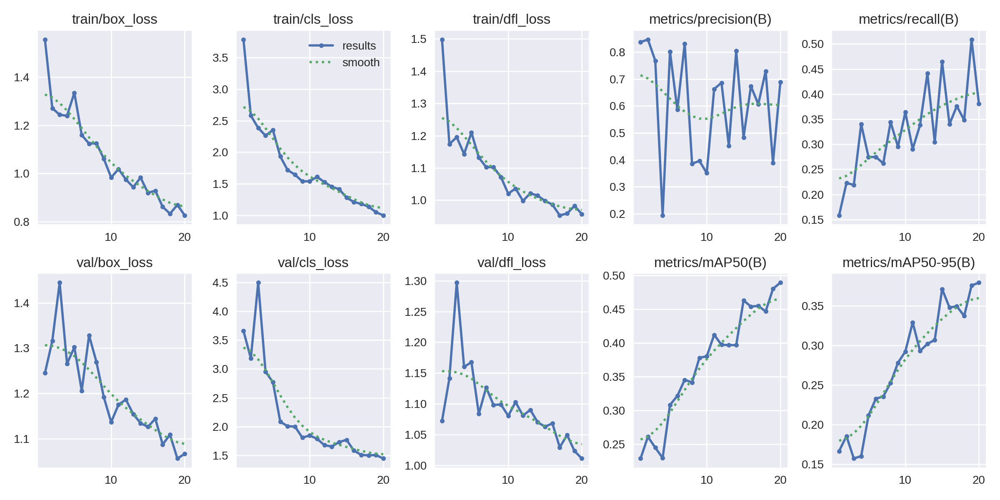

In [66]:
Image('/content/runs/detect/train/results.png', width=1000)

А вот тут мы видим, что результаты хуже, результатов модели Faster RCNN. Попробуем обучать дальше. Возьмем модель с лучшими весами для дообучения.

In [ ]:
model = YOLO("runs/detect/train/weights/best.pt")
results = model.train(data='/content/data_yolo/data_yolo.yaml', epochs=20, imgsz=640)

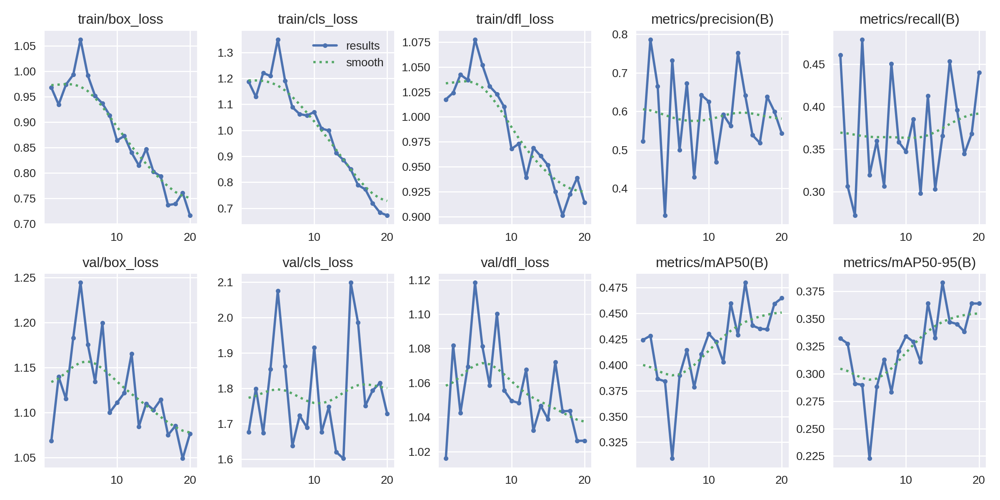

In [69]:
Image('/content/runs/detect/train2/results.png', width=1000)

Результаты полностью разочаровывают - mAP не достгла даже 0.5.

Вернемся на старую версию модели YOLOv5.

In [ ]:
# загружаем предобученную модель
model = YOLO('yolov5s.pt')

# процесс ее обучения
results = model.train(data='/content/data_yolo/data_yolo.yaml', epochs=20, imgsz=640)

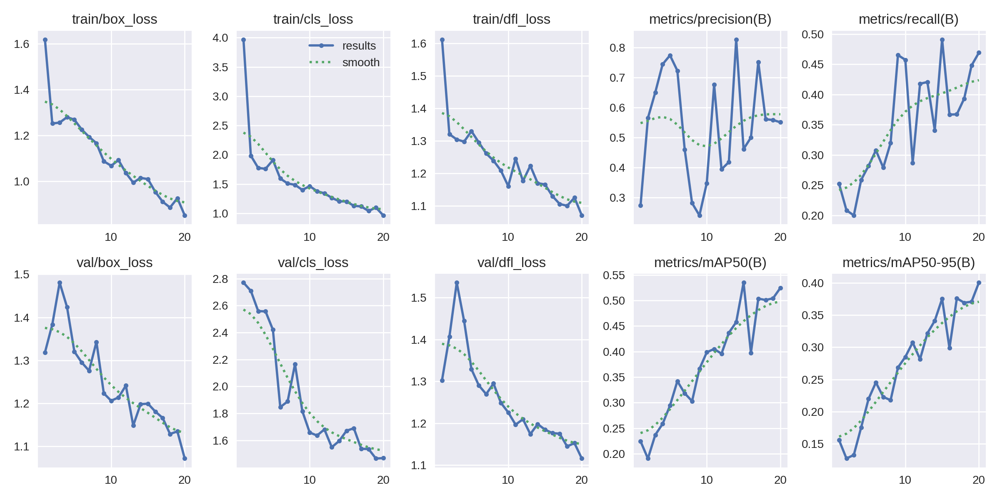

In [73]:
Image('/content/runs/detect/train4/results.png', width=1000)

Уже лучше. Пробуем дообучить, используя последние веса.

In [ ]:
model = YOLO("runs/detect/train4/weights/last.pt")
results = model.train(data='/content/data_yolo/data_yolo.yaml', epochs=20, imgsz=640)

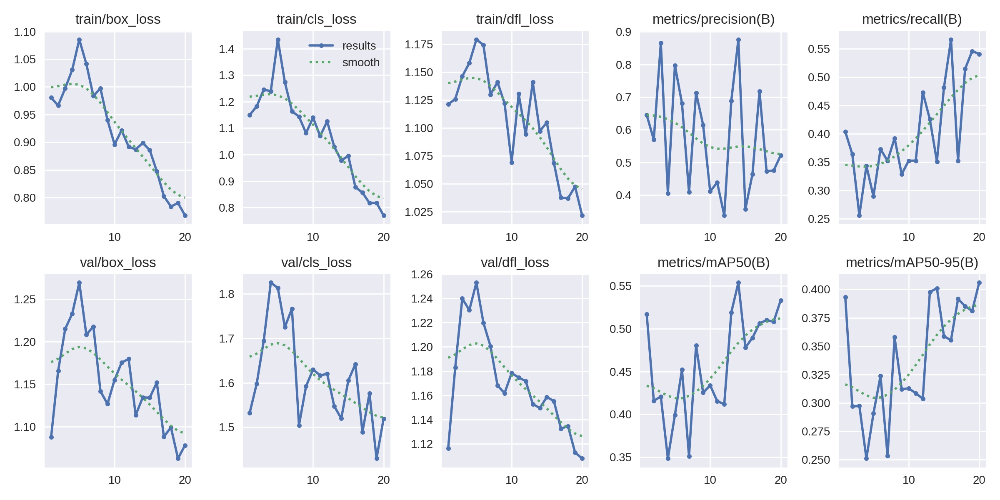

In [75]:
Image('/content/runs/detect/train5/results.png', width=1000)

Так, хорошо. Будем брать количеством эпох:

In [ ]:
model = YOLO("runs/detect/train5/weights/last.pt")
results = model.train(data='/content/data_yolo/data_yolo.yaml', epochs=100, imgsz=640)

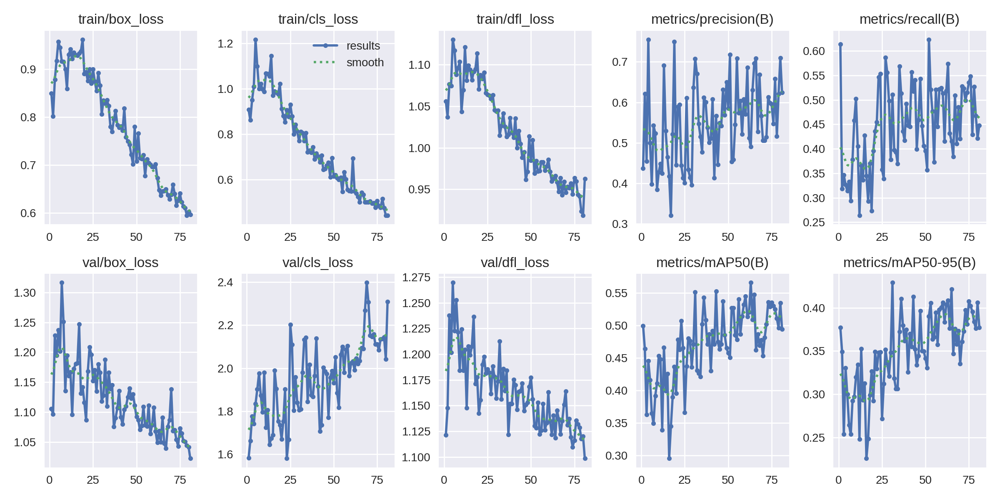

In [77]:
Image('/content/runs/detect/train6/results.png', width=1000)

К сожалению, суммарно за 140 эпох улучшить mAP_50 мне не удалось, оно сохраняется где-то на 0.55.

### 4.4. Визуализация полученных результатов

- Отрисуем батч на валидации:

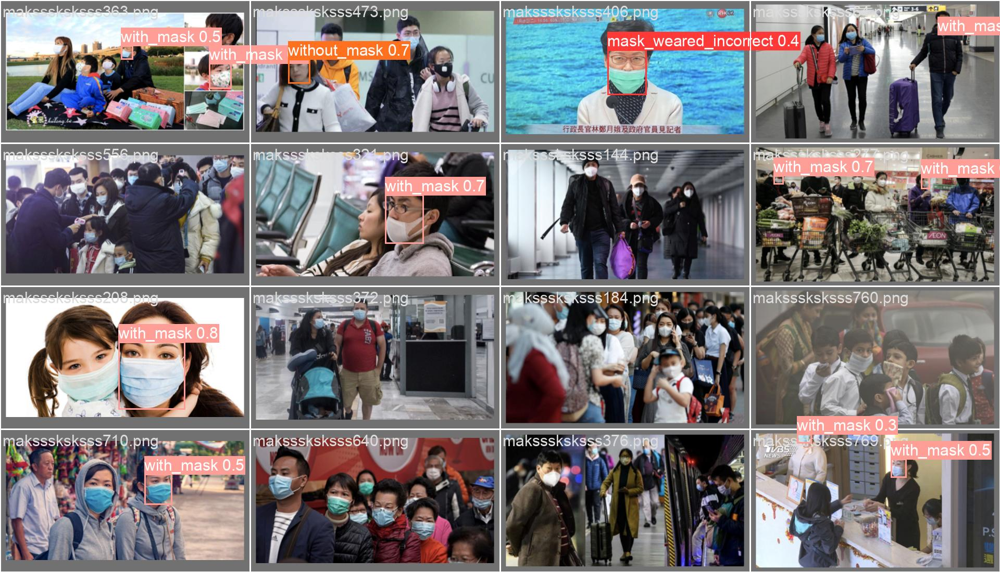

In [79]:
print("TARGET")
Image('/content/runs/detect/train6/val_batch0_labels.jpg', width=1000)

PREDICTION


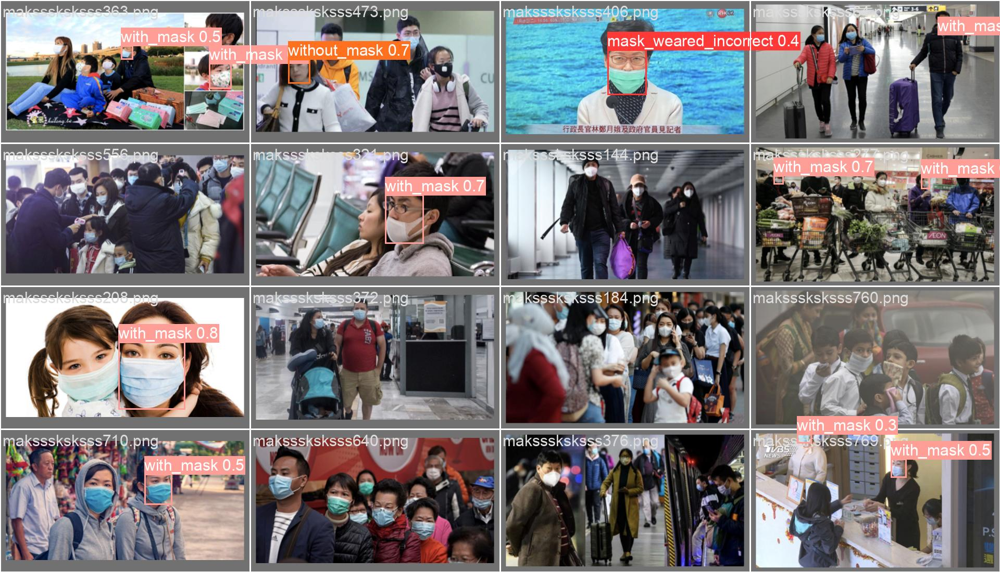

In [80]:
print("PREDICTION")
Image('/content/runs/detect/train6/val_batch0_pred.jpg', width=1000)

- Инференс:

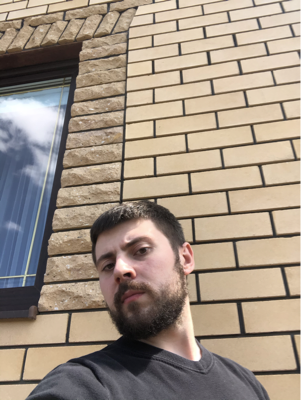

In [83]:
Image('/content/data_yolo/images/val/maksssksksss172.png')

In [81]:
results = model('/content/data_yolo/images/val/maksssksksss172.png')

/usr/local/lib/python3.10/dist-packages/ultralytics/utils/torch_utils.py:190: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#cublasApi_reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:156.)
  fusedconv.weight.copy_(torch.mm(w_bn, w_conv).view(fusedconv.weight.shape))
/usr/local/lib/python3.10/dist-packages/ultralytics/utils/torch_utils.py:195: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this opera

image 1/1 /content/data_yolo/images/val/maksssksksss172.png: 640x512 1 without_mask, 149.2ms
Speed: 1.9ms preprocess, 149.2ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 512)


Ну, инференц достаточно прост - крупное лицо без маски, о чем нам наша обученная модель и сообщила.

In [86]:
# сохраним зависимости

import locale
def getpreferredencoding(do_setlocale = True):
    return "UTF-8"
locale.getpreferredencoding = getpreferredencoding

!pip freeze > requirements.txt

## 5. Выводы
- проект выполнен на платформе Google Colab Pro, датасет был загружен с Kaggle
- обнаружены проблемы с некоторыми файлами изображений датасета, которые приводили к багам в модуле Albumentations (на Kaggle старые версии библиотек и там все работает нормально)
- проблемные файлы удалены из выборки
- обучены 2 детектора, относящиеся с моделям типа Faster RCNN и YOLO
- целевую метрику mAP удалось достичь только на Faster RCNN
- мне проще работать на YOLO, кроме того модели этого семейства менее ресурсоемки, однако в данном проекте мне не удалось правильно ее обучить
- возможные причины невыполнения целевого показателя на YOLO:
  - недостаток моих знаний и опыта работы
  - при осмотре валидационного батча обращает на себя внимание наличие только 1-2 bobx на изображении (неправильно сконвертирован датасет?)
  - вероятно, небольшой объем датасета (только 800 с небольшим картинок), среди которых довольно много мелких объектов
  - в целом, YOLO позиционируется как сеть, которая рабоает быстро, но с меньшим качеством, чем двухступенчатые конкуренты